In [1]:
!pip install mediapipe opencv.python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 32.9 MB 91.8 MB/s 


In [2]:
import mediapipe as mp
import cv2
import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import seaborn as sns
from scipy.misc import derivative
from scipy.signal import find_peaks
from statistics import stdev,mean
from scipy.interpolate import interp1d
import itertools as itr
import statistics
from google.colab.patches import cv2_imshow
import pprint, pickle

## definitions

In [38]:
#Parameter definitions

def hip_angle_right(x26,x24,y24,y26):
    output=math.atan(((x26-x24))/(abs(y24-y26)))
    return output

def hip_angle_left(x25,x23,y23,y25):
    output=math.atan(((x25-x23))/abs(y23-y25))
    return output

def thigh_angle(x24,x26,x25,x23,y24,y26,y23,y25):
    a=(math.atan((x26-x24))/abs(y24-y26))
    b=(math.atan((x25-x23))/abs(y23-y25))
    return abs(a-b)

def knee_angle_xyz(x24,x26,x28,y24,y26,y28,z24,z26,z28):
    a = math.sqrt((x24 -x28)**2 + (y24-y28)**2 + (z24-z28)**2)
    b = math.sqrt((x24 -x26)**2 + (y24-y26)**2 + (z24-z26)**2)
    c = math.sqrt((x26 -x28)**2 + (y26-y28)**2 + (z26-z28)**2) 
    output_xyz= math.acos((b**2+ c**2 - a**2) / (2*b*c))    
    return output_xyz

def knee_angle_xy(x24,x26,x28,y24,y26,y28):
    p = math.sqrt((x24 -x28)**2 + (y24-y28)**2)
    q = math.sqrt((x24 -x26)**2 + (y24-y26)**2 )
    r = math.sqrt((x26 -x28)**2 + (y26-y28)**2 )
    output_xy= math.acos((q**2+ r**2 - p**2) / (2*q*r))
    return output_xy

def Shoulder_angle(x14,x12,y12,y14):
    output=math.atan((x14-x12)/((y12-y14)))
    return output

def foot_lifting(y28,y27,x11,x12,x23,x24,y11,y12,y23,y24):
    body_length = math.sqrt((((x11+x12)/2)-((x23+x24)/2))**2+(((y11+y12)/2)-((y23+y24)/2))**2)
    output=(y28 - y27)/body_length
    return output

def thigh_ratio(x24,x26,x23,x25,y24,y26,y23,y25):
    thigh_r = math.sqrt((x24-x26)**2 + (y24-y26)**2)
    thigh_l = math.sqrt((x23-x25)**2 + (y23-y25)**2)
    ratio = thigh_l/thigh_r
    return ratio

def distance(x11,x12,x31):
    output = (x31 - (x11+x12)/2)
    return output   

def hip_ankle_right(y28,x11,x12,x23,x24,y11,y12,y23,y24):
    body_length = math.sqrt((((x11+x12)/2)-((x23+x24)/2))**2+(((y11+y12)/2)-((y23+y24)/2))**2)
    output = abs(y24-y28)/body_length
    return output
def hipa(y24,y28):
    o=abs(y24-y28)
    return o
def hip_ankle_left(y27,x11,x12,x23,x24,y11,y12,y23,y24):
    body_length = math.sqrt((((x11+x12)/2)-((x23+x24)/2))**2+(((y11+y12)/2)-((y23+y24)/2))**2)
    output = abs(y23-y27)/body_length
    return output

#Other definitions

def get_valleys(df,y,p):
    valley, _ = find_peaks(-y,prominence=p)
    plt.figure(figsize=(100,5))
    plt.plot(df.t,y)
    plt.plot(df.t[valley], y[valley],"X",markerfacecolor='red',markersize=8)
    plt.show()
    return valley

def get_peaks(df,y,p):
    peak, _ = find_peaks(y,prominence=p)
    plt.figure(figsize=(100,5))
    plt.plot(df.t,y)
    plt.plot(df.t[peak], y[peak], "X",markerfacecolor='red',markersize=8)
    plt.show()
    return peak

def com(A,B):
    if type(A)==np.ndarray:
        C= A.tolist()
    else:
        C=A
    for i,v in enumerate(B):
        C.insert(2*i+1,v) 
    return C

def time_diff(peaks, df):
    array=[]
    for i in range(len(peaks)-1):
        td=df.t[peaks[i+1]]-df.t[peaks[i]]
        array.append(td)
    return array


def distribution(data):
    ax=sns.distplot(data,
                kde=True,
                bins=8,
                color='blue',
                hist_kws={"linewidth": 22,'alpha':0.60})
    ax.set(xlabel='Binomial',ylabel='Frequency')
    plt.show()
    
def remove_time_gap(data):
    from statistics import stdev,mean
    SD=stdev(data)
    m= mean(data)
 
    cut_off = SD * 0.5
    upper =  m + cut_off
    array = [x for x in data if x < upper]
    return array

def remove_distinct_peaks(array,df,Time_to_index_ratio,y,p,m):
    modified_mean= mean(array)
    Distance=Time_to_index_ratio*modified_mean*m
    
    peaks, _ = find_peaks(y,prominence=p,distance=Distance)
    plt.figure(figsize=(100,5))
    plt.plot(df.t,y)
    plt.plot(df.t[peaks], y[peaks],"X",markerfacecolor='red',markersize=8)
    plt.show()
    return peaks

def remove_distinct_valleys(array,df,Time_to_index_ratio,y,p,m):
    modified_mean= mean(array)
    Distance=Time_to_index_ratio*modified_mean*m
    
    valleys, _ = find_peaks(-y,prominence=p,distance=Distance)
    plt.figure(figsize=(100,5))
    plt.plot(df.t,y)
    plt.plot(df.t[valleys], y[valleys],"X",markerfacecolor='red',markersize=8)
    plt.show()
    return valleys

def sample(df,y,peak,time_return_points):
    a = np.array(df.t[peak])
    sample_max=[]
    for i in range(len(time_return_points)-1):
        index=np.where(np.logical_and(a>=time_return_points.t[i], a<=time_return_points.t[i+1]))
        s = list(map(lambda a : y[peak[a]], index[0]))
        sample_max.append(s)
    return sample_max

def sample_t(t,time_return_points):
    a = np.array(t)
    sample_strikes=[]
    for i in range(len(time_return_points)-1):
        index=np.where(np.logical_and(a>=time_return_points.t[i], a<=time_return_points.t[i+1]))
        s = list(map(lambda a : t[a], index[0]))
        sample_strikes.append(s)
    return sample_strikes

def max_avg(peaks_array):
    maximum=[]
    for m in peaks_array:
        if sum(m)==0:
            maximum.append([])
        if sum(m)!=0:
            average=sum(m)/len(m)
            maximum.append(average)
    return maximum

def maximum(peaks_array):
    maximum=[]
    for m in peaks_array:
        if sum(m)==0:
            maximum.append([])
        if sum(m)!=0:
            maximum.append(max(m))
    return maximum



def com(A,B):
    if type(A)==np.ndarray:
        C= A.tolist()
    else:
        C=A
    for i,v in enumerate(B):
        C.insert(2*i+1,v) 
    return C
def comb_dir_arrays(plus_array,minus_array,plus,minus):   
    if plus<minus:
        array=com(plus_array,minus_array)
    elif plus>minus:
        array=com(minus_array,plus_array)
    return array

def strides(sample_strikes):
    strides=[]
    for strike in sample_strikes:
        sample=[]
        for i in range(len(strike)-1):
            t_diff=strike[i+1]-strike[i]
            sample.append(abs(t_diff))
        strides.append(sample)
    return strides

def seq(x,df,y):   
    sample_max=[]   
    #we have to use interpolation method
    y_interp = interp1d(df.t,y)
    sam_t=[]
    t=x[0]
    #calculate sample width
    s_width=(x[-1]-x[0])/10
    for i in range(10):
    sam_t.append(t)
    t=t+s_width
    #find y values to corresponding sampling t values
    y=y_interp(sam_t)
    s=y.tolist()
    sample_max.append(s)
    flat =[]
    for i in sample_max:
    for val in i:
        flat.append(val)
    return flat

def sv(df,peak,time_return_points,key_array):
    a = np.array(df.t[peak])
    sample_max=[]
    for i in range(len(time_return_points)-1):
        index=np.where(np.logical_and(a>=time_return_points.t[i], a<=time_return_points.t[i+1]))
        s = list(map(lambda a : key_array[peak[a]][0][0], index[0]))
        sample_max.append(s)
    return sample_max

def remove_time_gap(data):
    from statistics import stdev,mean
    SD=stdev(data)
    m= mean(data)
 
    cut_off = SD * 0.5
    upper =  m + cut_off
    array = [x for x in data if x < upper]
    return array
    
def sample_time(df,strike_peak,time_return_points):
    a = np.array(df.t[strike_peak])
    sample_strikes=[]
    for i in range(len(time_return_points)-1):
        index=np.where(np.logical_and(a>=time_return_points.t[i], a<=time_return_points.t[i+1]))
        s = list(map(lambda a : df.t[strike_peak[a]], index[0]))
        sample_strikes.append(s)
    return sample_strikes

In [ ]:
names=['amani','gayanjali','harshi','hasitha','isurika','gihan','jayasanka','chathura','geemanthi','damith']
index=0
name=names[index]

f_file = open('key_arrays/left/key_array_{}_left.pkl'.format(name), 'rb')

key_array = pickle.load(f_file)
#pprint.pprint(fT)

f_file.close()

## Feature vector array - side 

In [6]:
D_s = [[None,None],[None],[None,None],[None,None],[None,None],[None,None],[None,None],[None],[None]]

## Walking direction 

         center            t
0      0.874583     0.460952
1      0.874646     0.566355
2      0.874471     0.655099
3      0.873783     0.750068
4      0.873135     0.835765
...         ...          ...
17728  0.781146  1965.889503
17729  0.781704  1965.989895
17730  0.781902  1966.100260
17731  0.782452  1966.196103
17732  0.782313  1966.291409

[17733 rows x 2 columns]
body center variation


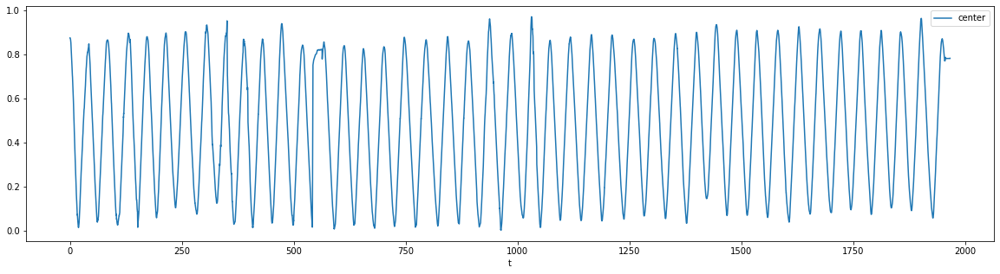

velocity


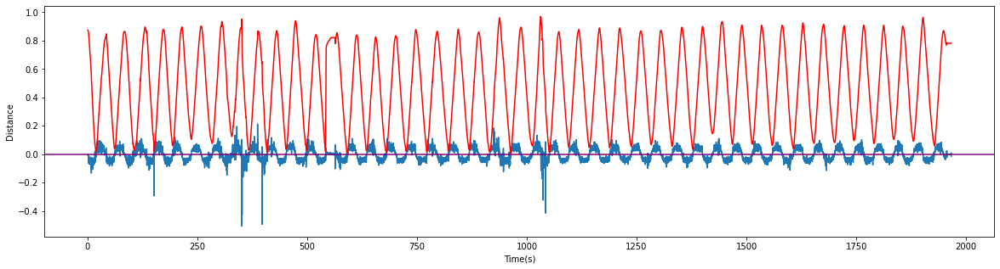

[186, 390, 569, 775, 991, 1203, 1393, 1596, 1794, 2002, 2202, 2414, 2647, 2858, 3058, 3269, 3415, 3591, 3782, 3978, 4182, 4383, 4600, 4795, 4993, 5219, 5427, 5623, 5817, 6001, 6229, 6422, 6637, 6823, 7046, 7246, 7481, 7678, 7894, 8083, 8302, 8474, 8711, 8918, 9150, 9306, 9475, 9673, 9875, 10082, 10295, 10504, 10710, 10918, 11154, 11357, 11562, 11769, 12000, 12200, 12432, 12636, 12840, 13048, 13250, 13449, 13657, 13849, 14068, 14270, 14495, 14696, 14921, 15120, 15342, 15540, 15744, 15935, 16143, 16341, 16540, 16734, 16952, 17146, 17379, 17569]
    index            t
0     186    19.546885
1     390    42.361872
2     569    61.457483
3     775    83.624376
4     991   106.618666
..    ...          ...
81  16734  1856.144358
82  16952  1880.297951
83  17146  1902.058562
84  17379  1928.287069
85  17569  1948.964389

[86 rows x 2 columns]
86


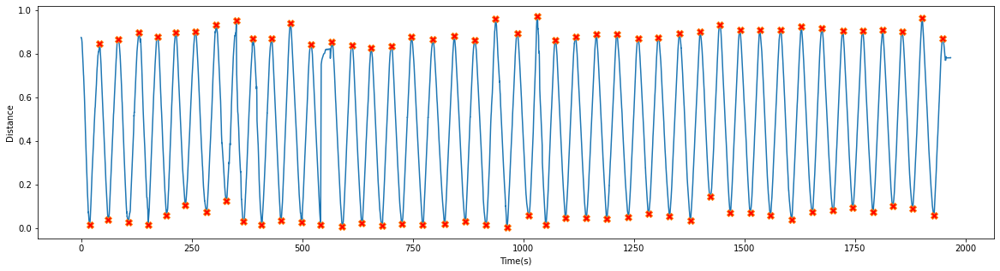

[    0     1   158   160   180   181   183   184   185   354   355   366
   367   389   390   391   399   400   564   565   569   571   572   579
   580   677   678   765   766   775   777   778   780   782   783   784
   787   788   959   960   962   963   969   971   983   984   991   995
   996  1005  1006  1014  1015  1017  1018  1019  1020  1101  1102  1105
  1106  1131  1132  1202  1206  1207  1233  1240  1369  1370  1375  1376
  1387  1388  1389  1390  1392  1398  1399  1505  1506  1591  1592  1593
  1594  1596  1794  1795  1796  1804  1805  1807  1808  1809  1810  1830
  1831  1836  1837  2001  2201  2407  2408  2411  2412  2414  2419  2420
  2565  2566  2568  2569  2577  2578  2610  2611  2647  2649  2650  2810
  2811  2834  2837  2838  2839  2854  2855  2857  2860  2861  2873  2874
  2935  2936  3039  3040  3042  3043  3057  3060  3061  3085  3086  3116
  3120  3137  3140  3222  3223  3243  3245  3250  3251  3256  3258  3260
  3262  3268  3361  3364  3382  3383  3410  3411  3

In [7]:
array =[]
for i in range(len(key_array)):
    t=key_array[i][28][3]
    center=(key_array[i][11][0]+key_array[i][12][0]+key_array[i][23][0]+key_array[i][24][0])/4
    array.append([center])
    array[i].append(t)
array = np.array(array)
df = pd.DataFrame(array,columns=['center','t'])
print(df)

print ("body center variation")
df.plot(x ='t', y='center', kind = 'line',figsize=(20,5))
plt.show()


from scipy.interpolate import UnivariateSpline

spl = UnivariateSpline(df.t, df.center, k=4, s=0)
diffspl = spl.derivative()

print ("velocity")
plt.figure(figsize=(20,5))
plt.plot(df.t,diffspl(df.t))
plt.plot(df.t,df.center,'r')
plt.xlabel('Time(s)')
plt.ylabel('Distance')
plt.axhline(y=0, color='purple', linestyle='-')
plt.show()

#To identify the return points
return_points_plus , _ = find_peaks(df.center,prominence=0.09)
return_points_minus , _ = find_peaks(-df.center,prominence=0.09)
if return_points_plus[0]<return_points_minus[0]:
    return_points=com(return_points_plus,return_points_minus)
else:
    return_points=com(return_points_minus,return_points_plus)
print(return_points)
time_return_points=pd.DataFrame(df.t[return_points],columns=['t']).reset_index()
print(time_return_points)
print(len(time_return_points))
plt.figure(figsize=(20,5))
plt.xlabel('Time(s)')
plt.ylabel('Distance')
plt.plot(df.t,df.center)
plt.plot(df.t[return_points], df.center[return_points],"X",markerfacecolor='red',markersize=8)
plt.show()

#zero crossing points of velocity graph
a = diffspl(df.t)
zero_crossings = np.where(np.diff(np.sign(a)))[0]
print(zero_crossings)

#To divide data set for two walking directions
if df.center[zero_crossings[0]]>df.center[zero_crossings[1]]:
    plus=1
    minus=0
elif df.center[zero_crossings[0]]<df.center[zero_crossings[1]]:
    plus=0
    minus=1
else:
    print("error in direction detection")

df['velocity'] = diffspl(df.t)
print(df)

# Hip angle

In [8]:
Hip_angle=[]

for i in range(len(key_array)):
    t=key_array[i][28][3]
    hr=math.degrees(hip_angle_right(key_array[i][26][0],key_array[i][24][0],key_array[i][24][1],key_array[i][26][1]))
    hl=math.degrees(hip_angle_left(key_array[i][25][0],key_array[i][23][0],key_array[i][23][1],key_array[i][25][1]))
    center=(key_array[i][11][0]+key_array[i][12][0]+key_array[i][23][0]+key_array[i][24][0])/4
    Hip_angle.append([hr])
    Hip_angle[i].append(hl)
    Hip_angle[i].append(t)
    Hip_angle[i].append(center)
    Hip_angle[i].append(diffspl(t))
Hip_angle = np.array(Hip_angle)

df_hip = pd.DataFrame(Hip_angle,columns=['right','left','t','center','velocity'])
print(df_hip)

df_plus=df_hip[df_hip.velocity > 0] 
df_minus=df_hip[df_hip.velocity < 0]
df_minus.loc[:,'right'] *= -1
df_minus.loc[:,'left'] *= -1
df_plus =df_plus.reset_index()
df_minus=df_minus.reset_index()
print(df_plus)
print(df_minus)

          right      left            t    center  velocity
0     -1.130724 -2.023010     0.460952  0.874583 -0.002617
1     -0.708786 -2.726590     0.566355  0.874646  0.000723
2     -1.052331 -3.241900     0.655099  0.874471 -0.005032
3     -1.152508 -4.165868     0.750068  0.873783 -0.008217
4     -1.240685 -4.436050     0.835765  0.873135 -0.006633
...         ...       ...          ...       ...       ...
17728 -3.765384  4.323502  1965.889503  0.781146  0.008195
17729 -4.189897  4.369226  1965.989895  0.781704  0.002501
17730 -4.217771  4.384288  1966.100260  0.781902  0.003561
17731 -3.769969  4.327578  1966.196103  0.782452  0.006052
17732 -3.619859  4.309834  1966.291409  0.782313 -0.014929

[17733 rows x 5 columns]
      index      right      left            t    center  velocity
0         1  -0.708786 -2.726590     0.566355  0.874646  0.000723
1       159 -10.537874 -4.713797    16.620986  0.071601  0.020953
2       160  -8.558460 -7.158272    16.729020  0.074313  0.001666
3 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


## Hip angle - right

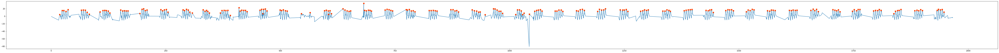

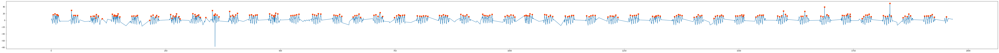

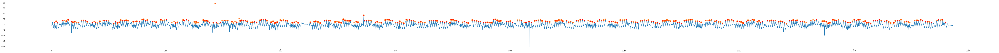

10.324661235314384
[5.143899440765381, 3.7642855644226074, 4.6157379150390625, 4.359256029129028, 29.20490336418152, 4.242046117782593, 4.4640374183654785, 3.636138439178467, 4.653548717498779, 23.649784088134766, 6.4613330364227295, 3.685075283050537, 3.6782453060150146, 4.247322082519531, 3.277096748352051, 23.60062289237976, 4.305358171463013, 4.014901876449585, 3.749237298965454, 3.813946485519409, 26.096445560455322, 4.630311012268066, 3.4576528072357178, 3.6507625579833984, 3.8948886394500732, 30.077346086502075, 3.9641456604003906, 3.8144407272338867, 4.2327351570129395, 3.6146974563598633, 32.67500710487366, 3.1086394786834717, 4.24561333656311, 4.114267826080322, 3.5037944316864014, 5.108411550521851, 23.611823081970215, 3.9605255126953125, 3.456998586654663, 2.851996421813965, 3.2975378036499023, 24.391884326934814, 3.361741781234741, 4.4825520515441895, 3.989593029022217, 4.182300567626953, 5.499101877212524, 18.93297839164734, 2.2552382946014404, 3.6055660247802734, 4.10727

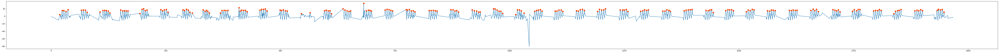

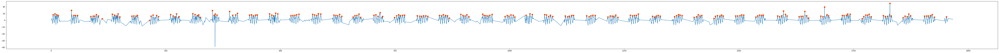

[[15.171111923875669, 15.099987929222493, 12.901447750044861, 17.31984875439197], [], [16.166206553350648, 16.5261584851703, 15.912317213328713, 10.32868555401886], [], [11.470763595343238, 15.173343775041388, 15.767522137056002, 15.242851555342348, 13.923820001684913, 8.591214809869268], [16.635528993102522], [16.635528993102522, 14.440728264944418, 14.646934266416872, 14.170960835806593, 14.351595575051993], [], [7.487485096178079, 18.392113444356994, 19.841546976599023, 15.241267575805253, 16.70607220245164], [], [17.613441496815618, 14.710324978784993, 17.160753875622316, 18.104588968751255, 11.175780280074074], [], [16.94737746895263, 15.310231726697928, 18.41458837849816, 16.384939080509458, 10.969996268136025], [8.81317418226019], [16.887723588486132, 13.462313994036657, 15.606479945313271, 12.796307300656762, 8.658910568958246], [], [8.615505953726684, 15.22133779196327, 15.831955936808003, 15.056580235785281, 15.755066147884708], [], [22.584964626631606, 13.733176374030714, 16

In [10]:
peaks_plus=get_peaks(df_plus,df_plus.right,10)
peaks_minus=get_peaks(df_minus,df_minus.right,12)
peaks = get_peaks(df_hip,df_hip.right,15)
Time_to_index_ratio=(peaks_plus[1]-peaks_plus[0])/(df.t[peaks_plus[1]]-df.t[peaks_plus[0]])
print(Time_to_index_ratio)
df_plus_right=time_diff(peaks_plus,df_plus)
df_minus_right=time_diff(peaks_minus,df_minus)
print(df_plus_right)
print(df_minus_right)

plus_peaks_R=remove_distinct_peaks(df_plus_right,df_plus,Time_to_index_ratio,df_plus.right,10,0.2)
minus_peaks_R=remove_distinct_peaks(df_minus_right,df_minus,Time_to_index_ratio,df_minus.right,10,0.3)
plus_peaks_sets=sample(df_plus,df_plus.right,plus_peaks_R,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.right,minus_peaks_R,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

Hip_angle_plus_R=list((map(lambda a : np.mean(a), plus_peaks_sets[plus::2])))
Hip_angle_minus_R=list((map(lambda a : np.mean(a), minus_peaks_sets[minus::2])))
print(Hip_angle_plus_R)
print('\n')
print(Hip_angle_minus_R)

D1=comb_dir_arrays(Hip_angle_plus_R,Hip_angle_minus_R,plus,minus)
print (D1)
print (len(D1))
D_s[0][0]=D1

## Hip angle - left

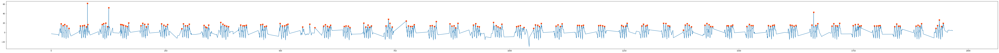

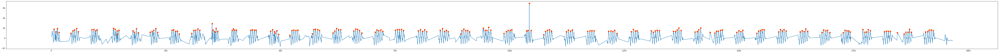

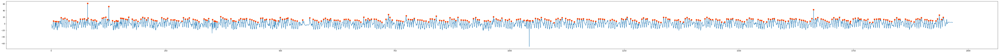

9.297732367856495
[4.269801139831543, 3.551772117614746, 4.712482452392578, 4.399985313415527, 24.977027893066406, 4.785231113433838, 4.014489650726318, 4.407695293426514, 2.346418857574463, 0.7615056037902832, 31.281654596328735, 3.245504140853882, 4.3370137214660645, 3.9833285808563232, 2.6335768699645996, 26.000704526901245, 3.097752094268799, 3.1779630184173584, 4.481832027435303, 3.520122766494751, 3.133340358734131, 26.775234937667847, 3.8322925567626953, 4.288158416748047, 3.7103469371795654, 3.7144079208374023, 29.656699180603027, 4.873232841491699, 4.05103063583374, 4.067686080932617, 31.182018280029297, 3.3946406841278076, 4.256170988082886, 4.748080730438232, 3.512403964996338, 32.2594530582428, 3.4670608043670654, 2.9943747520446777, 3.675955057144165, 26.34437346458435, 4.682232856750488, 4.031758785247803, 4.213451862335205, 4.1414196491241455, 26.32068419456482, 5.045634984970093, 3.3757946491241455, 4.175657749176025, 31.037129878997803, 4.5673980712890625, 4.3174309730

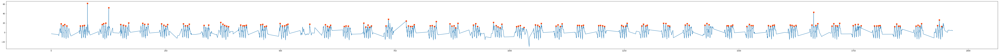

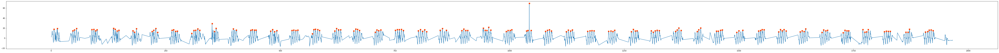

[[18.632408920039296, 14.903624321930439, 16.993511590339168, 13.907526687893993], [], [14.10589313002482, 14.251965375412931, 15.081492606328696, 61.81761465586301], [], [16.891696613783132, 18.721037240443636, 20.022367642805584, 52.700292302772446], [16.823940960082556], [16.823940960082556, 15.646893884599974, 13.901371692092102, 20.138160941790193], [], [19.567858250246363, 17.53430431344174, 17.813897233815343], [], [18.57124622365553, 15.355201891348248, 13.391632829211394, 17.00598921518817], [], [18.356595723947592, 14.392091831863928, 14.263578977140476, 17.701040341613087], [], [15.013061348495949, 15.89546891878822], [], [21.489753276983443, 17.759315074797264, 15.019471890014525, 13.691908252556036, 12.402975665713775], [], [16.007482964726034, 14.213898405668083, 14.232297531309891, 15.562456773900427], [], [16.74963894676486, 17.46500152083138, 12.341956246055132, 13.778763991315616], [], [19.10667391558938, 13.86143296605726, 14.218769948074966, 16.054860054133854, 17.6

In [11]:
peaks_plus=get_peaks(df_plus,df_plus.left,15)
peaks_minus=get_peaks(df_minus,df_minus.left,15)
peaks = get_peaks(df_hip,df_hip.left,15)

Time_to_index_ratio=(peaks_plus[1]-peaks_plus[0])/(df.t[peaks_plus[1]]-df.t[peaks_plus[0]])
print(Time_to_index_ratio)

df_plus_left=time_diff(peaks_plus,df_plus)
df_minus_left=time_diff(peaks_minus,df_minus)
print(df_plus_left)
print(df_minus_left)

plus_peaks_L=remove_distinct_peaks(df_plus_left,df_plus,Time_to_index_ratio,df_plus.left,20,0.3)
minus_peaks_L=remove_distinct_peaks(df_minus_left,df_minus,Time_to_index_ratio,df_minus.left,20,0.3)

plus_peaks_sets=sample(df_plus,df_plus.left,plus_peaks_L,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.left,minus_peaks_L,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

Hip_angle_plus_L=list((map(lambda a : np.mean(a), plus_peaks_sets[plus::2])))
Hip_angle_minus_L=list((map(lambda a : np.mean(a), minus_peaks_sets[minus::2])))
print(Hip_angle_plus_L)
print('\n')
print(Hip_angle_minus_L)

D2=comb_dir_arrays(Hip_angle_plus_L,Hip_angle_minus_L,plus,minus)
print (D2)
print (len(D2))
D_s[0][1]=D2

# Thigh angle

          thigh            t    center  velocity
0      0.892973     0.460952  0.782313 -0.002617
1      2.019806     0.566355  0.782313  0.000723
2      2.192878     0.655099  0.782313 -0.005032
3      3.020481     0.750068  0.782313 -0.008217
4      3.203961     0.835765  0.782313 -0.006633
...         ...          ...       ...       ...
17728  8.102415  1965.889503  0.782313  0.008195
17729  8.574946  1965.989895  0.782313  0.002501
17730  8.618119  1966.100260  0.782313  0.003561
17731  8.111117  1966.196103  0.782313  0.006052
17732  7.942544  1966.291409  0.782313 -0.014929

[17733 rows x 4 columns]


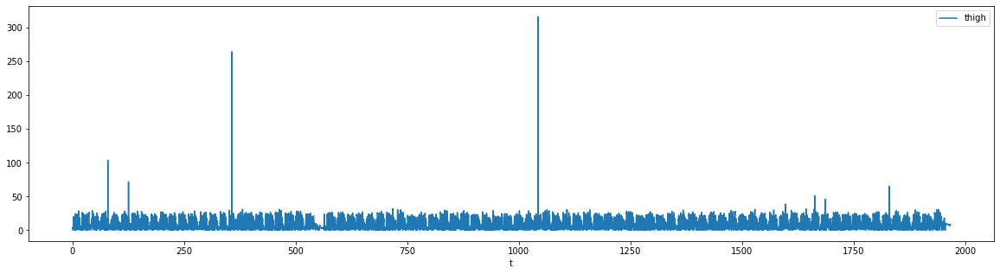

      index     thigh            t    center  velocity
0         1  2.019806     0.566355  0.782313  0.000723
1       159  5.932725    16.620986  0.782313  0.020953
2       160  1.426704    16.729020  0.782313  0.001666
3       181  0.908499    18.993104  0.782313  0.004038
4       184  1.659766    19.326969  0.782313  0.002336
...     ...       ...          ...       ...       ...
8554  17727  7.211500  1965.789542  0.782313  0.003607
8555  17728  8.102415  1965.889503  0.782313  0.008195
8556  17729  8.574946  1965.989895  0.782313  0.002501
8557  17730  8.618119  1966.100260  0.782313  0.003561
8558  17731  8.111117  1966.196103  0.782313  0.006052

[8559 rows x 5 columns]
      index     thigh            t    center  velocity
0         0  0.892973     0.460952  0.782313 -0.002617
1         2  2.192878     0.655099  0.782313 -0.005032
2         3  3.020481     0.750068  0.782313 -0.008217
3         4  3.203961     0.835765  0.782313 -0.006633
4         5  3.902295     0.929567  0.78

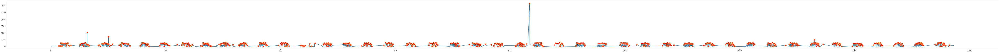

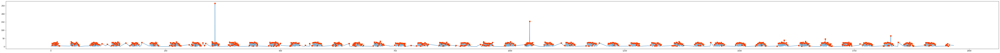

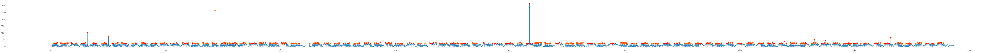

[[6.890570516494195, 5.174147888534137, 4.485986804597512, 4.559724092128905, 26.457805128051483, 4.621448348793341, 25.016916837507726, 5.052206090276252, 23.00935996826062, 23.1629115535466, 21.277433511154932, 24.90057694594036, 5.517173127923866, 19.930231882927526, 26.683541740787273, 9.107810304070941, 5.627037781033964], [10.10533211466782], [12.295994114888988, 19.08145055744578, 24.198657847989473, 24.859731657941477, 11.18532754955315, 25.358113522283517, 2.9292895316075893, 23.083482273270825, 28.374764085578388, 18.091800705813878, 14.628364792247318, 103.65685936394, 13.644717821003196, 15.554875346004422, 14.313216057920144, 7.461215540181809, 7.662987059995201], [11.16722352068896, 11.820393206291442], [2.9628104155501753, 22.813585287251982, 23.64306889920287, 23.74689633673966, 18.033161326356495, 19.770488376357168, 22.508179628213924, 28.447700302826377, 25.171255635315656, 23.170883386999023, 17.73044678415685, 19.495569175881904, 20.558044193527238, 20.328279077074

In [12]:
Thigh=[]

for i in range(len(key_array)):
    t=key_array[i][28][3]
    x = math.degrees(thigh_angle(key_array[i][24][0],key_array[i][26][0],key_array[i][25][0],key_array[i][23][0],key_array[i][24][1],key_array[i][26][1],key_array[i][25][1],key_array[i][23][1]))
    Thigh.append([x])
    Thigh[i].append(t)
    Thigh[i].append(center)
    Thigh[i].append(diffspl(t))
Thigh = np.array(Thigh)

df_thigh = pd.DataFrame(Thigh,columns=['thigh','t','center','velocity'])
print(df_thigh)

df_thigh.plot(x ='t', y='thigh', kind = 'line',figsize=(20,5))
plt.show()

df_plus=df_thigh[df_thigh.velocity > 0] 
df_minus=df_thigh[df_thigh.velocity < 0]
df_plus =df_plus.reset_index()
df_minus=df_minus.reset_index()
print(df_plus)
print(df_minus)

peaks_plus=get_peaks(df_plus,df_plus.thigh,2)
peaks_minus=get_peaks(df_minus,df_minus.thigh,2)
peaks = get_peaks(df_thigh,df_thigh.thigh,20)

plus_peaks_sets=sample(df_plus,df_plus.thigh,peaks_plus,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.thigh,peaks_minus,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

Thigh_angle_plus=list((map(lambda a : np.max(a), plus_peaks_sets[plus::2])))
Thigh_angle_minus=list((map(lambda a : np.max(a), minus_peaks_sets[minus::2])))
print(Thigh_angle_plus)
print('\n')
print(Thigh_angle_minus)

D3=comb_dir_arrays(Thigh_angle_plus,Thigh_angle_minus,plus,minus)
print (D3)
print (len(D3))
D_s[1]=D3

# Knee angle

In [13]:
Knee_angle = []
for i in range(len(key_array)):
    t=key_array[i][28][3]
    x=math.degrees(knee_angle_xy(key_array[i][24][0],key_array[i][26][0],key_array[i][28][0],key_array[i][24][1],key_array[i][26][1],key_array[i][28][1]))  #standard equation x,y,z       
    y=math.degrees(knee_angle_xy(key_array[i][23][0],key_array[i][25][0],key_array[i][27][0],key_array[i][23][1],key_array[i][25][1],key_array[i][27][1]))  #standard equation x,y,z       
    
    Knee_angle.append([x])
    Knee_angle[i].append(y)
    Knee_angle[i].append(t)
    Knee_angle[i].append(center)
    Knee_angle[i].append(diffspl(t))
Knee_angle = np.array(Knee_angle)

df_knee = pd.DataFrame(Knee_angle,columns=['knee_right', 'knee_left','t','center','velocity'])
print(df_knee)

df_plus=df_knee[df_knee.velocity > 0] 
df_minus=df_knee[df_knee.velocity < 0]
df_plus =df_plus.reset_index()
df_minus=df_minus.reset_index()
print(df_plus)
print(df_minus)

       knee_right   knee_left            t    center  velocity
0      167.920868  171.234978     0.460952  0.782313 -0.002617
1      167.765121  169.958695     0.566355  0.782313  0.000723
2      167.839140  168.994711     0.655099  0.782313 -0.005032
3      167.378624  167.086308     0.750068  0.782313 -0.008217
4      167.425037  166.565192     0.835765  0.782313 -0.006633
...           ...         ...          ...       ...       ...
17728  174.560533  156.943597  1965.889503  0.782313  0.008195
17729  174.129761  156.930191  1965.989895  0.782313  0.002501
17730  174.158052  156.592741  1966.100260  0.782313  0.003561
17731  176.092125  156.652730  1966.196103  0.782313  0.006052
17732  176.243990  156.551909  1966.291409  0.782313 -0.014929

[17733 rows x 5 columns]
      index  knee_right   knee_left            t    center  velocity
0         1  167.765121  169.958695     0.566355  0.782313  0.000723
1       159  165.918216  156.562917    16.620986  0.782313  0.020953
2       160

## Knee angle- right leg 

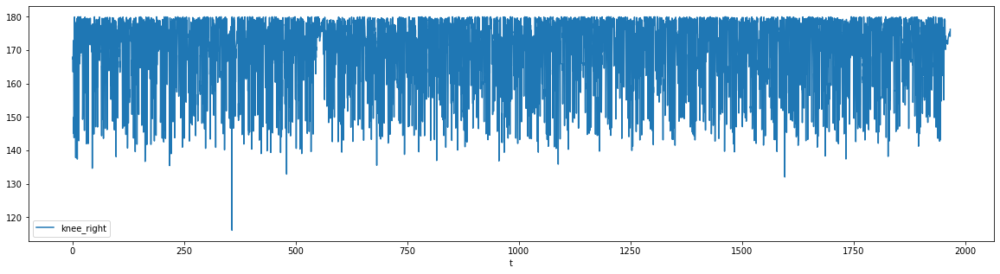

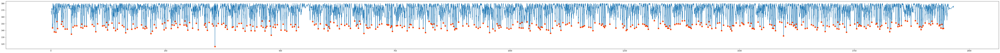

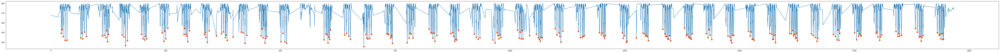

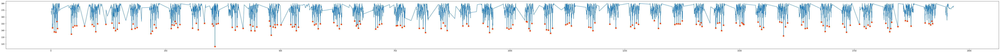

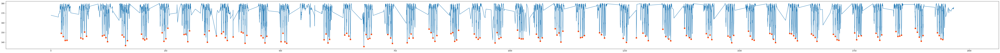

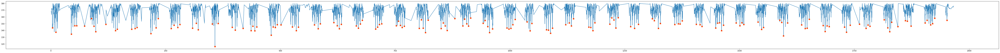

[[149.29682514696867, 145.95589395870894, 141.98390713382435, 142.0254674020453], [], [144.3784523341009, 143.59087075139593, 150.6065841460418, 146.2035719429196], [], [146.62174788402322, 147.2448954710077, 144.76718086118166, 140.6839942888288], [], [147.50709984666656, 145.45974508126312, 136.68885273459097, 141.7680107649398], [], [148.40049314337904, 143.66192767842654, 142.541878848653, 143.5823371331081], [], [149.74577796064966, 140.96590438360312, 143.62966348716577, 154.432553402862], [], [148.1089069661534, 148.31029228141904, 140.6147678602672, 151.7700730613584], [], [148.08487681283702, 140.1550731842759, 151.8111113112267], [146.63267437721655], [148.98187941794927, 150.68559715043696, 144.7208332717727, 141.90552121986406], [145.4842723505591], [150.61557843612175, 149.57113577852326, 139.0380912592218, 147.06137873969007], [], [146.7849499598697, 144.6281100930038, 139.35492452574184, 146.28281319951816], [], [140.59973169741167, 149.3736870952156, 140.40412367078554,

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [14]:
df_knee.plot(x ='t', y='knee_right', kind = 'line',figsize=(20,5))
plt.show()
get_valleys(df_knee,df_knee.knee_right,25)

valleys_plus=get_valleys(df_plus,df_plus.knee_right,25)
valleys_minus=get_valleys(df_minus,df_minus.knee_right,25)
Time_to_index_ratio=(valleys_plus[1]-valleys_plus[0])/(df.t[valleys_plus[1]]-df.t[valleys_plus[0]])
df_plus_right=time_diff(valleys_plus,df_plus)
df_minus_right=time_diff(valleys_minus,df_minus)
plus_valleys_R=remove_distinct_valleys(df_plus_right,df_plus,Time_to_index_ratio,df_plus.knee_right,25,0.4)
minus_valleys_R=remove_distinct_valleys(df_minus_right,df_minus,Time_to_index_ratio,df_minus.knee_right,20,0.4)

plus_valleys_sets=sample(df_plus,df_plus.knee_right,plus_valleys_R,time_return_points)
minus_valleys_sets=sample(df_minus,df_minus.knee_right,minus_valleys_R,time_return_points)
print(plus_valleys_sets)
print(minus_valleys_sets)

knee_plus_R=list((map(lambda a : np.mean(a), plus_valleys_sets[plus::2])))
knee_minus_R=list((map(lambda a : np.mean(a), minus_valleys_sets[minus::2])))
print(knee_plus_R)
print('\n')
print(knee_minus_R)

D4=comb_dir_arrays(knee_plus_R,knee_minus_R,plus,minus)
print (D4)
print (len(D4))
D_s[2][0]=D4

## Knee angle - left leg

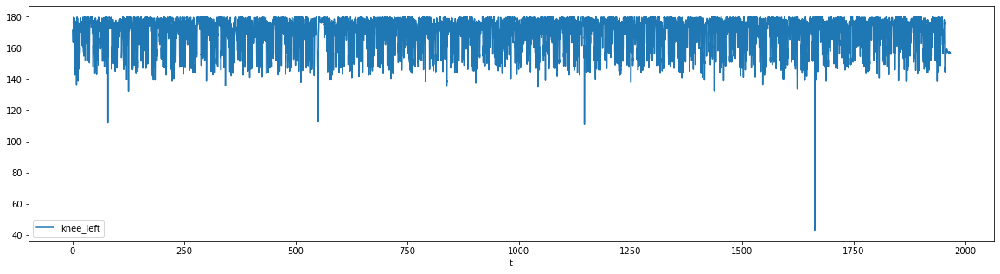

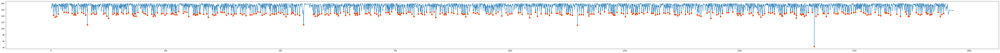

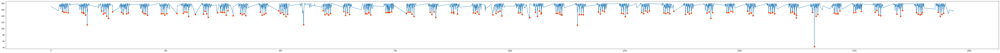

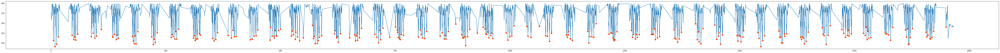

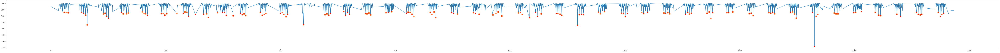

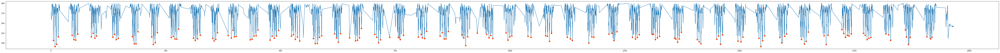

[[152.0663351058231, 151.60671974592236, 150.4523550359568], [], [151.4481070372228, 147.78191205554182, 143.10573988525277, 112.15516057737858], [], [146.21700566632256, 148.8924432860366, 139.77149171793656, 132.32978442810403], [], [151.49386938038643, 147.010634559066, 146.88256751370716, 149.6871999086199], [], [152.88722037506696, 147.78291080984806, 147.15857488810244, 142.59563486284827], [], [147.62279370124313, 147.86537502689006, 143.10013082430785, 147.35132040673014], [147.9589831225618], [148.77779921796045, 153.20958050167815, 151.99702032105245, 138.6607862272597], [144.84149618608788], [145.81422329620474, 147.1542765174688, 135.7612469067189], [150.37173592684113], [151.42871652994543, 151.39502855244586, 142.5845635210385], [141.04412825844602], [147.91590016790224, 144.07012200009666, 147.15093097385363, 141.41491993328756], [], [151.9814211309857, 142.72731595811473, 145.02770393253275, 148.6784293134687], [], [148.8143597674386, 151.55825190156256, 144.95066404784

In [15]:

df_knee.plot(x ='t', y='knee_left', kind = 'line',figsize=(20,5))
plt.show()
get_valleys(df_knee,df_knee.knee_left,25)

valleys_plus=get_valleys(df_plus,df_plus.knee_left,22)
valleys_minus=get_valleys(df_minus,df_minus.knee_left,20)
Time_to_index_ratio=(valleys_plus[1]-valleys_plus[0])/(df.t[valleys_plus[1]]-df.t[valleys_plus[0]])
df_plus_left=time_diff(valleys_plus,df_plus)
df_minus_left=time_diff(valleys_minus,df_minus)
plus_valleys_L=remove_distinct_valleys(df_plus_left,df_plus,Time_to_index_ratio,df_plus.knee_left,25,0.3)
minus_valleys_L=remove_distinct_valleys(df_minus_left,df_minus,Time_to_index_ratio,df_minus.knee_left,25,0.3)

plus_valleys_sets=sample(df_plus,df_plus.knee_left,plus_valleys_L,time_return_points)
minus_valleys_sets=sample(df_minus,df_minus.knee_left,minus_valleys_L,time_return_points)
print(plus_valleys_sets)
print(minus_valleys_sets)

knee_plus_L=list((map(lambda a : np.mean(a), plus_valleys_sets[plus::2])))
knee_minus_L=list((map(lambda a : np.mean(a), minus_valleys_sets[minus::2])))
print(knee_plus_L)
print('\n')
print(knee_minus_L)

D5=comb_dir_arrays(knee_plus_L,knee_minus_L,plus,minus)
print (D5)
print (len(D5))
D_s[2][1]=D5

# Angle between body and upper arm

In [16]:
shoulder_angle=[]

for i in range(len(key_array)):
    t=key_array[i][28][3]
    x1=math.degrees(Shoulder_angle(key_array[i][14][0],key_array[i][12][0],key_array[i][12][1],key_array[i][14][1]))
    x2=math.degrees(Shoulder_angle(key_array[i][11][0],key_array[i][13][0],key_array[i][11][1],key_array[i][13][1]))
    shoulder_angle.append([x1])
    shoulder_angle[i].append(x2)
    shoulder_angle[i].append(t)
    shoulder_angle[i].append(center)
    shoulder_angle[i].append(diffspl(t))
shoulder_angle = np.array(shoulder_angle)

df_sa = pd.DataFrame(shoulder_angle,columns=['shoulder_right', 'shoulder_left','t','center','velocity'])
print(df_sa)

df_plus=df_sa[df_sa.velocity > 0] 
df_minus=df_sa[df_sa.velocity < 0]
df_plus =df_plus.reset_index()
df_minus=df_minus.reset_index()
print(df_plus)
print(df_minus)

       shoulder_right  shoulder_left            t    center  velocity
0           -2.866156       7.526824     0.460952  0.782313 -0.002617
1           -3.297749       9.147364     0.566355  0.782313  0.000723
2           -3.533633       9.813708     0.655099  0.782313 -0.005032
3           -3.867917      11.053133     0.750068  0.782313 -0.008217
4           -4.410708      11.416054     0.835765  0.782313 -0.006633
...               ...            ...          ...       ...       ...
17728       -0.079078      -5.270225  1965.889503  0.782313  0.008195
17729        0.775906      -4.868821  1965.989895  0.782313  0.002501
17730        0.859188      -4.571854  1966.100260  0.782313  0.003561
17731        1.489787      -2.330964  1966.196103  0.782313  0.006052
17732        1.405512      -1.726027  1966.291409  0.782313 -0.014929

[17733 rows x 5 columns]
      index  shoulder_right  shoulder_left            t    center  velocity
0         1       -3.297749       9.147364     0.566355  0

## Angle between body and upper arm - right

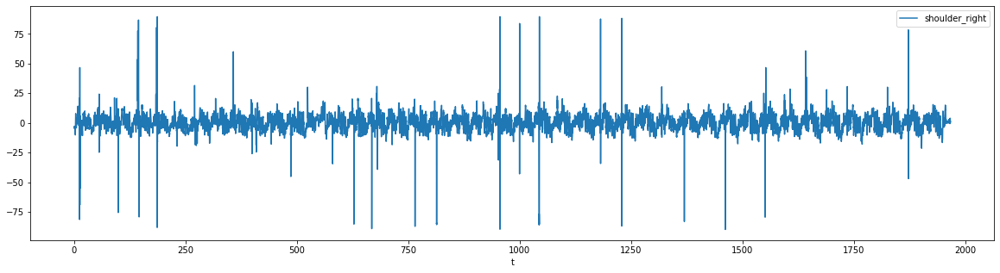

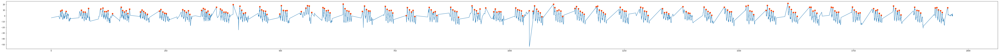

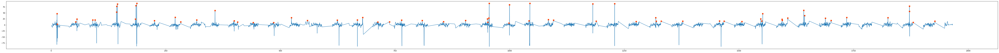

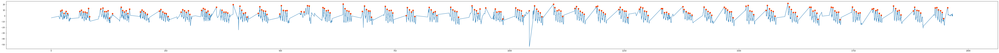

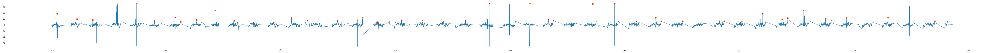

[[8.549985274696658, 10.07790022540061, 4.59586392234983, 7.824110765854702, 4.3231385587469005], [], [8.007913390468525, 10.118681004359907, 7.145808025669534, 6.830418192482101, 5.517988175366542, 13.187976232012504], [-1.236429686109103], [12.195524071767714, 13.756076933082557, 7.7229555793720195, 7.545836303879471, 9.283311810954702, -3.5881986975827913], [4.08381815485368], [15.19831861557821, 9.444691448731152, 6.992955167519026, 9.231341340116787, 4.386119060867986, 11.766322445786894], [], [7.163700694769845, 10.23213920718605, 7.889615095994627, 5.640366152144838, 3.022467338580574], [8.562637275041238], [8.562637275041238, 11.428028086190373, 7.058731219840339, 4.915101288858258, 4.357078197617346, -0.9802104905596141], [], [6.831555746982913, 11.102556342707917, 9.073440308541734, 6.324355584407535, 9.210342621284514, 2.7315753971116314], [9.87096150739153], [9.87096150739153, 13.209545334272505, 11.733321171596092, 6.48719308494286, 8.418676460844088, 2.8804173974450094], 

In [17]:
df_sa.plot(x ='t', y='shoulder_right', kind = 'line',figsize=(20,5))
plt.show()

peaks_plus=get_peaks(df_plus,df_plus.shoulder_right,10)
peaks_minus=get_peaks(df_minus,df_minus.shoulder_right,25)
Time_to_index_ratio=(peaks_plus[1]-peaks_plus[0])/(df.t[peaks_plus[1]]-df.t[peaks_plus[0]])
df_plus_right=time_diff(peaks_plus,df_plus)
df_minus_right=time_diff(peaks_minus,df_minus)
plus_peaks_R=remove_distinct_peaks(df_plus_right,df_plus,Time_to_index_ratio,df_plus.shoulder_right,5,0.2)
minus_peaks_R=remove_distinct_peaks(df_minus_right,df_minus,Time_to_index_ratio,df_minus.shoulder_right,25,0.3)

plus_peaks_sets=sample(df_plus,df_plus.shoulder_right,plus_peaks_R,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.shoulder_right,minus_peaks_R,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

max_avg_plus_r=max_avg(plus_peaks_sets)
print(max_avg_plus_r)

Sh_plus_R=list((map(lambda a : np.mean(a), plus_peaks_sets[plus::2])))
Sh_minus_R=list((map(lambda a : np.nan, minus_peaks_sets[minus::2]))) 
print(Sh_plus_R)
print('\n')
print(Sh_minus_R)

D6=comb_dir_arrays(Sh_plus_R,Sh_minus_R,plus,minus)
print (D6)
print (len(D6))
D_s[3][0]=D6

## Angle between body and upper arm - left

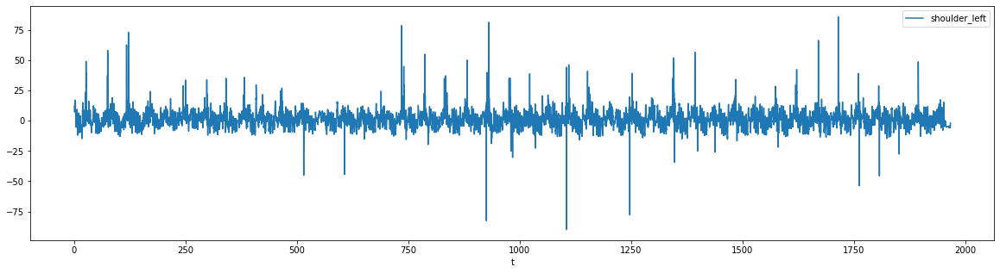

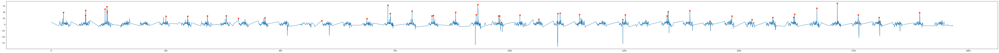

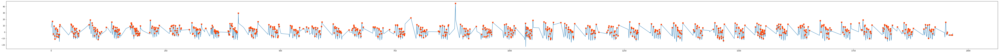

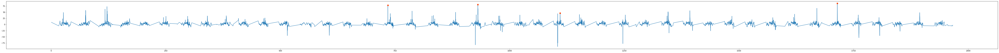

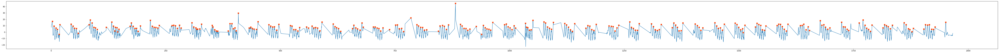

[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [78.62358194342757], [], [], [], [], [], [], [], [81.38288231813553], [], [], [], [], [], [], [], [46.29248610856857], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [86.03147971793688], [], [], [], [], [], [], [], [], [], []]
[[], [12.384605816733242, 9.552764486936205, 6.119880503640134, 5.705746206539221, -1.8096317921241534], [11.738913432261496], [19.12033616805033, 14.413637726461161, 7.590468686477468, 6.792564298688261, 4.271895890898331], [7.57402238739055], [15.798916883141914, 9.493531244357209, 1.7949950081273196, 7.622068390145389, 6.918320481701934, 0.41367723678871565, 4.4419725979536695], [9.320956453340257], [14.281768042873166, 9.161748941354329, 6.025394526785563, 5.806317729223898, 1.2263961621595012], [9.778341258736107], [18.434056337493985, 9.080096782104699, 7.65051050504897, 7.28718

In [18]:
df_sa.plot(x ='t', y='shoulder_left', kind = 'line',figsize=(20,5))
plt.show()

peaks_plus=get_peaks(df_plus,df_plus.shoulder_left,30)
peaks_minus=get_peaks(df_minus,df_minus.shoulder_left,0.8)
Time_to_index_ratio=(peaks_plus[1]-peaks_plus[0])/(df.t[peaks_plus[1]]-df.t[peaks_plus[0]])
df_plus_left=time_diff(peaks_plus,df_plus)
df_minus_left=time_diff(peaks_minus,df_minus)
plus_peaks_L=remove_distinct_peaks(df_plus_left,df_plus,Time_to_index_ratio,df_plus.shoulder_left,100,0.5)
minus_peaks_L=remove_distinct_peaks(df_minus_left,df_minus,Time_to_index_ratio,df_minus.shoulder_left,5,0.5)

plus_peaks_sets=sample(df_plus,df_plus.shoulder_left,plus_peaks_L,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.shoulder_left,minus_peaks_L,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

max_avg_plus_r=max_avg(plus_peaks_sets)
max_avg_minus_r=max_avg(minus_peaks_sets)
print(max_avg_plus_r)
print(max_avg_minus_r)

Sh_plus_L=list((map(lambda a : np.nan, plus_peaks_sets[plus::2])))
Sh_minus_L=list((map(lambda a : np.mean(a), minus_peaks_sets[minus::2])))
print(Sh_plus_L)
print('\n')
print(Sh_minus_L)

D7=comb_dir_arrays(Sh_plus_L,Sh_minus_L,plus,minus)
print (D7)
print (len(D7))
D_s[3][1]=D7

# Foot lifting distance

In [20]:
Foot_lifting=[]

for i in range(len(key_array)):
    t=key_array[i][28][3]
    x1=foot_lifting(key_array[i][28][1],key_array[i][27][1],key_array[i][11][0],key_array[i][12][0],key_array[i][23][0],key_array[i][24][0],key_array[i][11][1],key_array[i][12][1],key_array[i][23][1],key_array[i][24][1])
    x2=foot_lifting(key_array[i][27][1],key_array[i][28][1],key_array[i][11][0],key_array[i][12][0],key_array[i][23][0],key_array[i][24][0],key_array[i][11][1],key_array[i][12][1],key_array[i][23][1],key_array[i][24][1])
    leg_ratio= thigh_ratio(key_array[i][24][0],key_array[i][26][0],key_array[i][23][0],key_array[i][25][0],key_array[i][24][1],key_array[i][26][1],key_array[i][23][1],key_array[i][25][1])
    Foot_lifting.append([x1])
    Foot_lifting[i].append(x2)
    Foot_lifting[i].append(leg_ratio)
    Foot_lifting[i].append(t)
    Foot_lifting[i].append(center)
    Foot_lifting[i].append(diffspl(t))
Foot_lifting = np.array(Foot_lifting)

df_fl = pd.DataFrame(Foot_lifting,columns=['foot_right', 'foot_left','leg_ratio','t','center','velocity'])
print(df_fl)

df_plus=df_fl[df_fl.velocity > 0] 
df_minus=df_fl[df_fl.velocity < 0]
df_minus['foot_right_minus']=df_minus['foot_right']*df_minus['leg_ratio']
df_plus['foot_left_plus']=df_plus['foot_left']/df_plus['leg_ratio']
df_plus =df_plus.reset_index()
df_minus=df_minus.reset_index()
print(df_plus)
print(df_minus)

       foot_right  foot_left  leg_ratio            t    center  velocity
0       -0.080105   0.080105   0.979739     0.460952  0.782313 -0.002617
1       -0.075294   0.075294   0.991533     0.566355  0.782313  0.000723
2       -0.053477   0.053477   0.993295     0.655099  0.782313 -0.005032
3       -0.054727   0.054727   1.000699     0.750068  0.782313 -0.008217
4       -0.056069   0.056069   1.005150     0.835765  0.782313 -0.006633
...           ...        ...        ...          ...       ...       ...
17728    0.085950  -0.085950   0.980840  1965.889503  0.782313  0.008195
17729    0.074918  -0.074918   0.989270  1965.989895  0.782313  0.002501
17730    0.069479  -0.069479   0.990474  1966.100260  0.782313  0.003561
17731    0.058334  -0.058334   0.995399  1966.196103  0.782313  0.006052
17732    0.054906  -0.054906   0.992618  1966.291409  0.782313 -0.014929

[17733 rows x 6 columns]
      index  foot_right  foot_left  leg_ratio            t    center  \
0         1   -0.075294   

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


## foot lifting distance - right

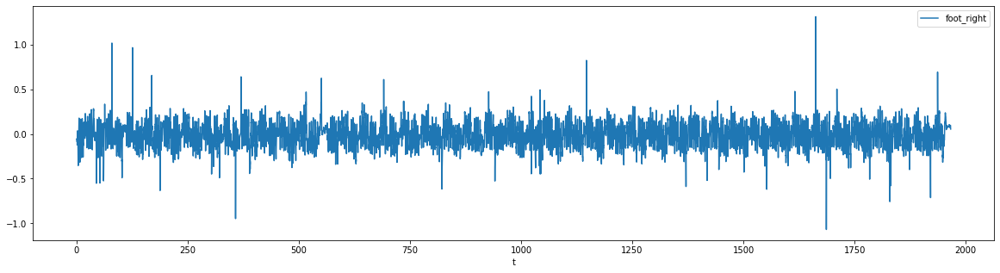

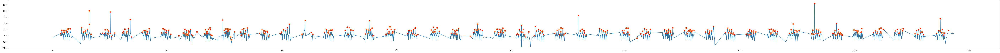

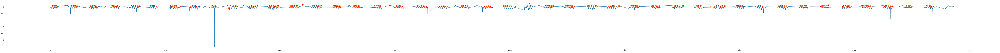

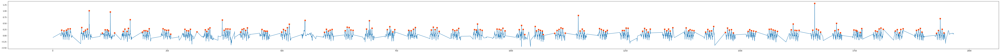

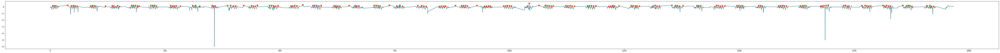

[[0.22863971735497343, 0.1969632851204443, 0.22591002861210613, 0.2731421121678657, 0.2831598776336974], [], [0.3335676988505299, 0.17120139260441594, 0.22725128506195535, 0.2650981171932595, 1.0175742211247523], [], [0.10404256923152151, 0.24082723972816295, 0.2400519315928957, 0.1953731710823794, 0.9661524970695742], [0.11055584976187467], [0.17820385046168633, 0.27111259422501693, 0.17450559206080507, 0.2986800515470439, 0.6551627939149068], [], [0.1493935996677173, 0.20533294669604946, 0.20431999551736985, 0.18491596214847209, 0.2857215487270661], [], [0.28480901786508483, 0.24271384357677475, 0.21955171725937392, 0.22504627444514216, 0.060810470157734074], [], [0.25877991620214086, 0.2055059590572684, 0.1944259963752591, 0.26125646934705316], [0.15642904939366326], [0.23697200761987844, 0.17295806127471158, 0.2708042879036113, 0.3159820246960834], [], [0.6399881225453978, 0.22154185920429648, 0.2719204619050814, 0.2721433363047639, 0.27155905442442546], [], [0.14734277348983085, 0

In [21]:
df_fl.plot(x ='t', y='foot_right', kind = 'line',figsize=(20,5))
plt.show()

peaks_plus=get_peaks(df_plus,df_plus.foot_right,0.1)
peaks_minus=get_peaks(df_minus,df_minus.foot_right_minus,0.3)
Time_to_index_ratio=(peaks_plus[1]-peaks_plus[0])/(df.t[peaks_plus[1]]-df.t[peaks_plus[0]])
df_plus_right=time_diff(peaks_plus,df_plus)
df_minus_right=time_diff(peaks_minus,df_minus)
plus_peaks_R=remove_distinct_peaks(df_plus_right,df_plus,Time_to_index_ratio,df_plus.foot_right,0.2,0.4)
minus_peaks_R=remove_distinct_peaks(df_minus_right,df_minus,Time_to_index_ratio,df_minus.foot_right_minus,0.3,0.3)

plus_peaks_sets=sample(df_plus,df_plus.foot_right,plus_peaks_R,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.foot_right_minus,minus_peaks_R,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

max_avg_plus_r=max_avg(plus_peaks_sets)
max_avg_minus_r=max_avg(minus_peaks_sets)
print(max_avg_plus_r)
print(max_avg_minus_r)

Fl_plus_R=list((map(lambda a : np.mean(a), plus_peaks_sets[plus::2])))
Fl_minus_R=list((map(lambda a : np.mean(a), minus_peaks_sets[minus::2])))
print(Fl_plus_R)
print('\n')
print(Fl_minus_R)

D8=comb_dir_arrays(Fl_plus_R,Fl_minus_R,plus,minus)
print (D8)
print (len(D8))
D_s[4][0]=D8

## foot lifting distance - left 

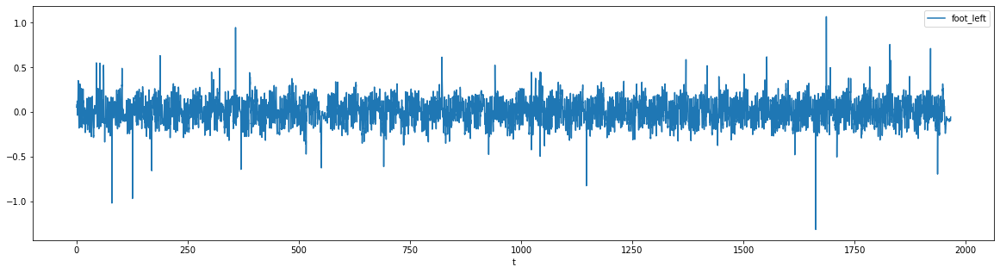

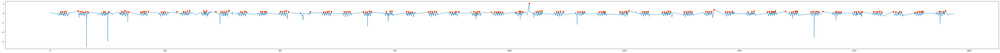

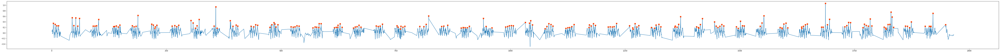

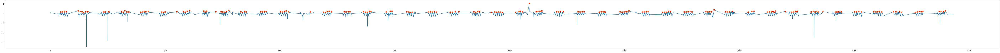

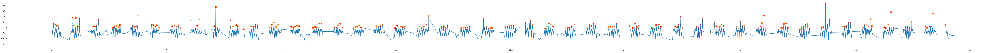

[[0.15836696229876837, 0.17389162388390206, 0.17222510018109743, 0.1851101375501465], [0.25666636635067525], [0.1913769508862887, 0.17102269714370294, 0.09052735178491099, 0.17161284675820382, 0.1650186880430727], [], [0.15510013803515774, 0.15112441728271991, 0.16421617969079344], [], [0.1896964545698871, 0.13352297870988758, 0.27251340094832144, 0.14246996943252568, 0.15733155611336813], [], [0.13776359363383484, 0.15705610545776966, 0.19927306859481814, 0.17113857075075936, 0.20457899068707314], [], [0.1520039227408275, 0.11496032860651362, 0.1497010273328457], [0.1697166986265532], [0.19195926350672352, 0.1252673847784256, 0.22819803867304808, 0.3046205499488349], [], [0.2394897550107003, 0.14123826732059055, 0.24637979773749025], [0.1768364759750248], [0.17619531448939724, 0.14484555378282082, 0.13830404075047004, 0.20464487883784707], [0.3160822025828531], [0.1727207323575133, 0.11527655548697673, 0.21621030502659985, 0.14899148705200535], [], [0.17800785400941802, 0.165434200649

In [22]:
df_fl.plot(x ='t', y='foot_left', kind = 'line',figsize=(20,5))
plt.show()

peaks_plus=get_peaks(df_plus,df_plus.foot_left_plus,0.3)
peaks_minus=get_peaks(df_minus,df_minus.foot_left,0.3)
Time_to_index_ratio=(peaks_plus[1]-peaks_plus[0])/(df.t[peaks_plus[1]]-df.t[peaks_plus[0]])
df_plus_left=time_diff(peaks_plus,df_plus)
df_minus_left=time_diff(peaks_minus,df_minus)
plus_peaks_L=remove_distinct_peaks(df_plus_left,df_plus,Time_to_index_ratio,df_plus.foot_left_plus,0.3,0.2)
minus_peaks_L=remove_distinct_peaks(df_minus_left,df_minus,Time_to_index_ratio,df_minus.foot_left,0.2,0.3)

plus_peaks_sets=sample(df_plus,df_plus.foot_left_plus,plus_peaks_L,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.foot_left,minus_peaks_L,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

max_avg_plus_r=max_avg(plus_peaks_sets)
max_avg_minus_r=max_avg(minus_peaks_sets)
print(max_avg_plus_r)
print(max_avg_minus_r)

Fl_plus_L=list((map(lambda a : np.mean(a), plus_peaks_sets[plus::2])))
Fl_minus_L=list((map(lambda a : np.mean(a), minus_peaks_sets[minus::2])))
print(Fl_plus_L)
print('\n')
print(Fl_minus_L)

D9=comb_dir_arrays(Fl_plus_L,Fl_minus_L,plus,minus)
print (D9)
print (len(D9))
D_s[4][1]=D9

# Step distance wrt neck position

In [31]:
neck_index=[]

for i in range(len(key_array)):
    t=key_array[i][28][3]
    x1=distance(key_array[i][11][0],key_array[i][12][0],key_array[i][32][0])
    x2=distance(key_array[i][11][0],key_array[i][12][0],key_array[i][31][0])
    neck_index.append([x1])
    neck_index[i].append(x2)
    neck_index[i].append(t)
    neck_index[i].append(center)
    neck_index[i].append(diffspl(t))
neck_index = np.array(neck_index)

df_dis = pd.DataFrame(neck_index,columns=['dis_right','dis_left','t','center','velocity'])
print(df_dis)

df_plus=df_dis[df_dis.velocity > 0] 
df_minus=df_dis[df_dis.velocity < 0]
df_minus.loc[:,'dis_right'] *= -1
df_minus.loc[:,'dis_left'] *= -1
df_plus =df_plus.reset_index()
df_minus=df_minus.reset_index()
print(df_plus)
print(df_minus)



       dis_right  dis_left            t    center  velocity
0      -0.025759 -0.019849     0.460952  0.782313 -0.002617
1      -0.022510 -0.018942     0.566355  0.782313  0.000723
2      -0.022095 -0.018206     0.655099  0.782313 -0.005032
3      -0.020890 -0.017029     0.750068  0.782313 -0.008217
4      -0.021629 -0.018098     0.835765  0.782313 -0.006633
...          ...       ...          ...       ...       ...
17728  -0.033237  0.033948  1965.889503  0.782313  0.008195
17729  -0.034156  0.033056  1965.989895  0.782313  0.002501
17730  -0.034403  0.032736  1966.100260  0.782313  0.003561
17731  -0.034418  0.032853  1966.196103  0.782313  0.006052
17732  -0.034289  0.033393  1966.291409  0.782313 -0.014929

[17733 rows x 5 columns]
      index  dis_right  dis_left            t    center  velocity
0         1  -0.022510 -0.018942     0.566355  0.782313  0.000723
1       159  -0.023456 -0.010707    16.620986  0.782313  0.020953
2       160  -0.022218 -0.032279    16.729020  0.782313 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


## Step distance wrt neck position - right 

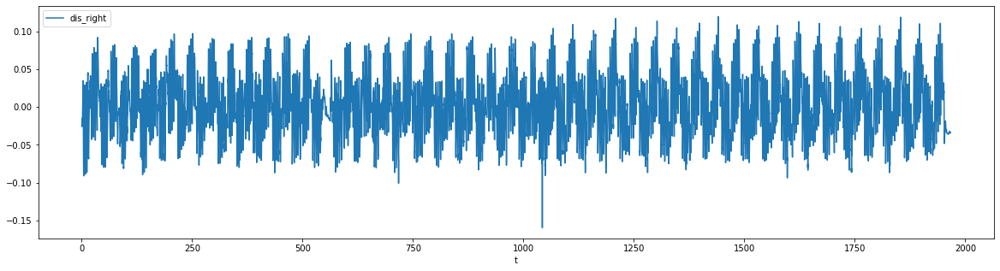

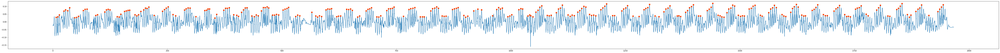

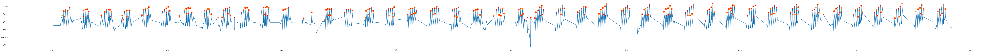

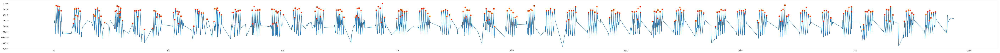

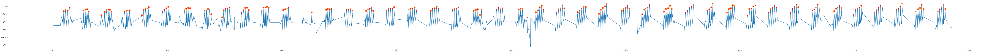

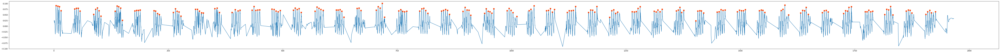

[[0.07086016237735748, 0.07888884842395782, 0.07269027829170227, 0.09224572777748108], [], [0.07393091917037964, 0.08133144676685333, 0.08274850249290466, 0.06540682911872864], [0.04430897440761328], [0.0645979717373848, 0.0788034051656723, 0.0814339816570282, 0.07865357398986816, 0.0681891143321991], [], [0.06781590729951859, 0.07108505070209503, 0.0753592848777771, 0.07663670182228088], [], [0.04465581104159355, 0.07786864787340164, 0.08934618532657623, 0.08724629878997803, 0.09689080715179443], [], [0.06913115829229355, 0.08120274543762207, 0.09018081426620483, 0.09745997190475464], [], [0.0772215947508812, 0.08487968146800995, 0.09087979793548584, 0.08972492814064026], [], [0.0739680603146553, 0.08384141325950623, 0.05111369490623474], [], [0.031161556020379066, 0.07651819288730621, 0.08873891830444336, 0.08827283978462219, 0.09221959114074707], [], [0.0620904415845871, 0.07866275310516357, 0.09063109755516052, 0.09166345000267029, 0.07677683234214783], [], [0.07167350873351097, 0.

In [29]:
df_dis.plot(x ='t', y='dis_right', kind = 'line',figsize=(20,5))
plt.show()
peaks_plus=get_peaks(df_dis,df_dis.dis_right,0.1)

peaks_plus=get_peaks(df_plus,df_plus.dis_right,0.04)
peaks_minus=get_peaks(df_minus,df_minus.dis_right,0.04)
Time_to_index_ratio=(peaks_plus[2]-peaks_plus[1])/(df.t[peaks_plus[2]]-df.t[peaks_plus[1]])
df_plus_right=time_diff(peaks_plus,df_plus)
df_minus_right=time_diff(peaks_minus,df_minus)
plus_peaks_R=remove_distinct_peaks(df_plus_right,df_plus,Time_to_index_ratio,df_plus.dis_right,0.07,0.5)
minus_peaks_R=remove_distinct_peaks(df_minus_right,df_minus,Time_to_index_ratio,df_minus.dis_right,0.07,0.5)

plus_peaks_sets=sample(df_plus,df_plus.dis_right,plus_peaks_R,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.dis_right,minus_peaks_R,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

max_avg_plus_r=max_avg(plus_peaks_sets)
max_avg_minus_r=max_avg(minus_peaks_sets)
print(max_avg_plus_r)
print(max_avg_minus_r)

neck_plus_R=list((map(lambda a : np.mean(a), plus_peaks_sets[plus::2])))
neck_minus_R=list((map(lambda a : np.mean(a), minus_peaks_sets[minus::2])))
print(neck_plus_R)
print('\n')
print(neck_minus_R)

D10=comb_dir_arrays(neck_plus_R,neck_minus_R,plus,minus)
print (D10)
print (len(D10))
D_s[5][0]=D10

## Step distance wrt neck position - left 

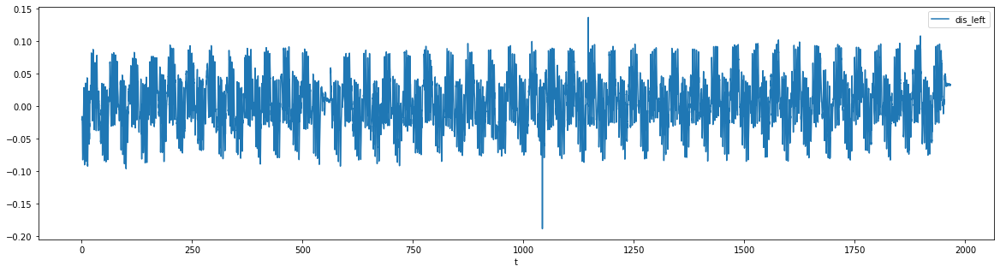

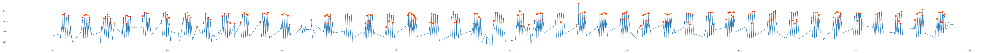

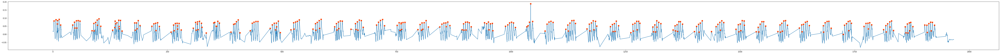

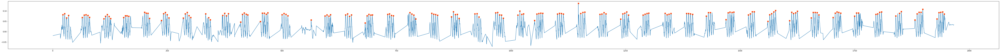

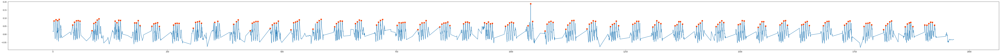

[[0.08233296498656273, 0.08772461116313934, 0.06732158362865448, 0.0786864161491394], [], [0.06866439059376717, 0.08083410561084747, 0.08273227512836456, 0.07922619581222534, 0.06942933797836304], [], [0.06276071071624756, 0.07436537742614746, 0.08321714401245117, 0.07346439361572266, 0.06375819444656372], [], [0.06893821805715561, 0.07708673179149628, 0.07708358764648438, 0.0749267041683197], [], [0.09441746771335602, 0.08962354063987732, 0.08942785859107971, 0.06493213772773743], [], [0.05453578382730484, 0.08698125183582306, 0.09341764450073242, 0.08202609419822693, 0.06672152876853943], [], [0.06620662473142147, 0.08662200719118118, 0.09356662631034851, 0.07795768976211548, 0.06901562213897705], [], [0.08627887070178986, 0.0683256983757019, 0.0579046905040741], [], [0.07890694960951805, 0.08940322697162628, 0.07750004529953003, 0.08779528737068176], [], [0.04717399738729, 0.08366551995277405, 0.09054850041866302, 0.08523401618003845, 0.08148476481437683], [], [0.049606631975620985,

In [33]:
df_dis.plot(x ='t', y='dis_left', kind = 'line',figsize=(20,5))
plt.show()

peaks_plus=get_peaks(df_plus,df_plus.dis_left,0.04)
peaks_minus=get_peaks(df_minus,df_minus.dis_left,0.04)
Time_to_index_ratio=(peaks_plus[2]-peaks_plus[1])/(df.t[peaks_plus[2]]-df.t[peaks_plus[1]])
df_plus_left=time_diff(peaks_plus,df_plus)
df_minus_left=time_diff(peaks_minus,df_minus)
plus_peaks_L=remove_distinct_peaks(df_plus_left,df_plus,Time_to_index_ratio,df_plus.dis_left,0.07,0.5)
minus_peaks_L=remove_distinct_peaks(df_minus_left,df_minus,Time_to_index_ratio,df_minus.dis_left,0.06,0.5)

plus_peaks_sets=sample(df_plus,df_plus.dis_left,plus_peaks_L,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.dis_left,minus_peaks_L,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

max_avg_plus_r=max_avg(plus_peaks_sets)
max_avg_minus_r=max_avg(minus_peaks_sets)
print(max_avg_plus_r)
print(max_avg_minus_r)

neck_plus_L=list((map(lambda a : np.mean(a), plus_peaks_sets[plus::2])))
neck_minus_L=list((map(lambda a : np.mean(a), minus_peaks_sets[minus::2])))
print(neck_plus_L)
print('\n')
print(neck_minus_L)

D11=comb_dir_arrays(neck_plus_L,neck_minus_L,plus,minus)
print (D11)
print (len(D11))
D_s[5][1]=D11

# Hip to ankle distance

In [34]:
hip_nk=[]

for i in range(len(key_array)):
    t=key_array[i][28][3]
    x1=hip_ankle_right(key_array[i][28][1],key_array[i][11][0],key_array[i][12][0],key_array[i][23][0],key_array[i][24][0],key_array[i][11][1],key_array[i][12][1],key_array[i][23][1],key_array[i][24][1])
    x2=hip_ankle_left(key_array[i][27][1],key_array[i][11][0],key_array[i][12][0],key_array[i][23][0],key_array[i][24][0],key_array[i][11][1],key_array[i][12][1],key_array[i][23][1],key_array[i][24][1])
    x= hipa(key_array[i][24][1],key_array[i][28][1])
    leg_ratio= thigh_ratio(key_array[i][24][0],key_array[i][26][0],key_array[i][23][0],key_array[i][25][0],key_array[i][24][1],key_array[i][26][1],key_array[i][23][1],key_array[i][25][1])
    hip_nk.append([x1])
    hip_nk[i].append(x2)
    hip_nk[i].append(x)
    hip_nk[i].append(leg_ratio)
    hip_nk[i].append(t)
    hip_nk[i].append(center)
    hip_nk[i].append(diffspl(t))
hip_nk = np.array(hip_nk)

df_hank = pd.DataFrame(hip_nk,columns=['hnk_right', 'hnk_left','r','leg_ratio','t','center','velocity'])
print(df_hank)

df_plus=df_hank[df_hank.velocity > 0] 
df_minus=df_hank[df_hank.velocity < 0]
df_minus['hip_ankle_minus']=df_minus['hnk_right']*df_minus['leg_ratio']
df_plus['hip_ankle_plus']=df_plus['hnk_left']/df_plus['leg_ratio']
df_plus =df_plus.reset_index()
df_minus=df_minus.reset_index()
print(df_plus)
print(df_minus)

       hnk_right  hnk_left         r  leg_ratio            t    center  \
0       1.254182  1.332244  0.198838   0.979739     0.460952  0.782313   
1       1.298585  1.371888  0.201837   0.991533     0.566355  0.782313   
2       1.338988  1.391136  0.206216   0.993295     0.655099  0.782313   
3       1.359140  1.413469  0.206993   1.000699     0.750068  0.782313   
4       1.360866  1.415859  0.206846   1.005150     0.835765  0.782313   
...          ...       ...       ...        ...          ...       ...   
17728   1.331933  1.239959  0.197887   0.980840  1965.889503  0.782313   
17729   1.335119  1.250113  0.197910   0.989270  1965.989895  0.782313   
17730   1.332816  1.249628  0.197551   0.990474  1966.100260  0.782313   
17731   1.325884  1.249884  0.196377   0.995399  1966.196103  0.782313   
17732   1.320646  1.245903  0.195771   0.992618  1966.291409  0.782313   

       velocity  
0     -0.002617  
1      0.000723  
2     -0.005032  
3     -0.008217  
4     -0.006633  
...

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


## hip to ankle distance - right

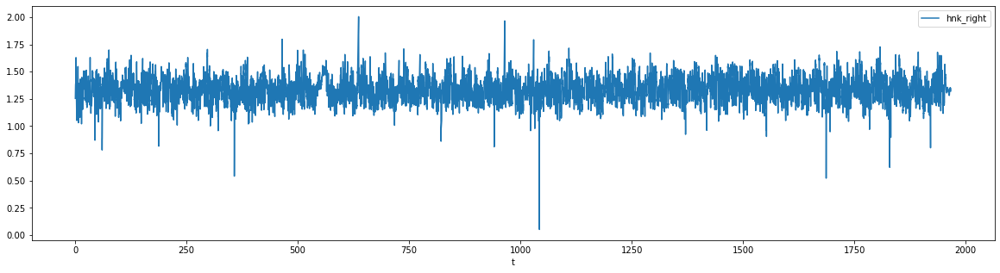

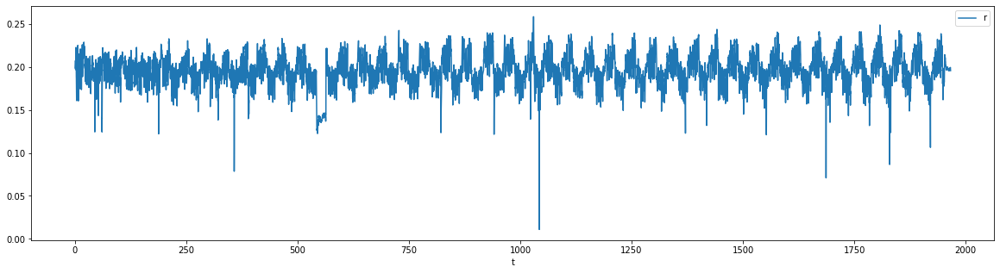

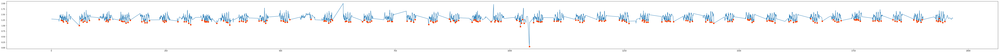

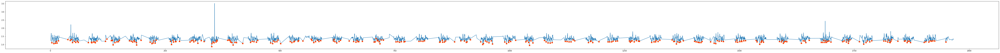

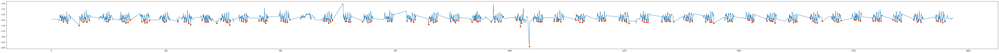

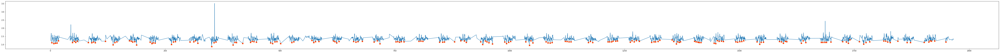

[[1.2367214352403344, 1.1705101275128877, 1.1951886958531655, 1.1179749628960765], [1.000645460893771], [1.2277846566128603, 1.1616058411698678, 1.2038672494731046, 1.1563927063739832, 1.2353192166720781], [], [1.191305542328077, 1.1788810299216705, 1.2751567770998302], [], [1.1867868495752818, 1.188333344977992, 1.1106131395947807, 1.1423090564135214, 1.2378991625039737], [], [1.1761754116049077, 1.2110676884703564, 1.132776757080355, 1.127512582388988, 1.2225130211676358], [], [1.210850871846424, 1.1562374509346736, 1.1876347470992175], [1.1747944275086344], [1.1795305423334985, 1.1790437565068745, 1.1101663280507683, 1.0436236998149235], [], [1.2395164809725088, 1.1673245340798006, 1.1705999119343873, 1.168211242065955], [1.1048696323862641], [1.214012792941762, 1.155213582326208, 1.1353902970066927], [1.0275231599953587], [1.2084130727229307, 1.1837318464171505, 1.1511361701114644, 1.2145910511040217], [], [1.2124179159233006, 1.2226714777449097, 1.1744630542391485, 1.1075058970267

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [35]:
df_hank.plot(x ='t', y='hnk_right', kind = 'line',figsize=(20,5))
plt.show()
df_hank.plot(x ='t', y='r', kind = 'line',figsize=(20,5))
plt.show()

peaks_plus=get_valleys(df_plus,df_plus.hnk_right,0.2)
peaks_minus=get_valleys(df_minus,df_minus.hip_ankle_minus,0.2)
Time_to_index_ratio=(peaks_plus[1]-peaks_plus[0])/(df.t[peaks_plus[1]]-df.t[peaks_plus[0]])
df_plus_right=time_diff(peaks_plus,df_plus)
df_minus_right=time_diff(peaks_minus,df_minus)
plus_peaks_R=remove_distinct_valleys(df_plus_right,df_plus,Time_to_index_ratio,df_plus.hnk_right,0.2,0.3)
minus_peaks_R=remove_distinct_valleys(df_minus_right,df_minus,Time_to_index_ratio,df_minus.hip_ankle_minus,0.25,0.4)

plus_peaks_sets=sample(df_plus,df_plus.hnk_right,plus_peaks_R,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.hip_ankle_minus,minus_peaks_R,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

hnk_plus_R=list((map(lambda a : np.mean(a), plus_peaks_sets[plus::2])))
hnk_minus_R=list((map(lambda a : np.mean(a), minus_peaks_sets[minus::2])))
print(hnk_plus_R)
print('\n')
print(hnk_minus_R)

D12=comb_dir_arrays(hnk_plus_R,hnk_minus_R,plus,minus)
print (D12)
print (len(D12))
D_s[6][0]=D12

## Stride length

In [37]:
plus_x= sv(df_plus,plus_peaks_R,time_return_points,key_array)
minus_x= sv(df_minus,minus_peaks_R,time_return_points,key_array)
gap_plus= strides(plus_x)
gap_minus= strides(minus_x)
print (gap_plus)
print (gap_minus)

plus_stride_length_R=list(map(lambda a : np.mean(a), gap_plus[plus::2]))
minus_stride_length_R=list(map(lambda a : np.mean(a), gap_minus[minus::2]))
print(plus_stride_length_R)
print('\n')
print(minus_stride_length_R)

Stride_length=comb_dir_arrays(plus_stride_length_R,minus_stride_length_R,plus,minus)
print (Stride_length)
D15=Stride_length
print (len(D15))
D_s[7]=D15

[[0.20191437005996704, 0.34627869725227356, 0.15406952798366547], [], [0.17749521136283875, 0.15760672092437744, 0.17934966087341309, 0.03572523593902588], [], [0.11373711377382278, 0.06903994828462601], [], [0.15066611766815186, 0.15437006950378418, 0.015379071235656738, 0.14847177267074585], [], [0.23063138127326965, 0.11827646195888519, 0.08853752911090851, 0.10403694212436676], [], [0.14196741580963135, 0.13665670156478882], [], [0.20484009385108948, 0.13848277181386948, 0.14354892820119858], [], [0.29510992765426636, 0.1277814507484436, 0.08928096294403076], [], [0.22475583106279373, 0.007273778319358826], [], [0.1923571527004242, 0.18946373462677002, 0.00945436954498291], [], [0.20378029346466064, 0.2530432343482971, 0.12212393432855606, 0.002132795751094818], [], [0.2200305461883545, 0.1436769962310791, 0.16927999258041382, 0.0035686492919921875], [], [], [], [0.06465354561805725, 0.25589342415332794, 0.19617244601249695, 0.21504050493240356], [], [0.036049067974090576, 0.203848

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


## Stride velocity

In [39]:
df_plus_right=time_diff(plus_peaks_R, df_plus)
df_plus_right_cleaned=remove_time_gap(df_plus_right)
df_minus_right=time_diff(minus_peaks_R,df_minus)
df_minus_right_cleaned=remove_time_gap(df_minus_right)

sample_strikes_plus_R=sample_time(df_plus,plus_peaks_R,time_return_points)
sample_strikes_minus_R=sample_time(df_minus,minus_peaks_R,time_return_points)

stride_time_plus_R=strides(sample_strikes_plus_R)
stride_time_minus_R=strides(sample_strikes_minus_R)
print(stride_time_plus_R)
print('\n')
print(stride_time_minus_R)

avg_stride_plus_R=list(map(lambda a : np.mean(a), stride_time_plus_R[plus::2]))
avg_stride_minus_R=list(map(lambda a : np.mean(a), stride_time_minus_R[minus::2]))
print(avg_stride_plus_R)
print('\n')
print(avg_stride_minus_R)

Time=comb_dir_arrays(avg_stride_plus_R,avg_stride_minus_R,plus,minus)
print (Time)

velocity =[]
for i in range (len(Stride_length)):
    velocity.append(Stride_length[i]/Time[i])
print (velocity)
D16=velocity
print (len(D16))
D_s[8]=D16

[[4.4931416511535645, 6.277162551879883, 2.763125419616699], [], [4.09129786491394, 3.675348997116089, 4.60566520690918, 5.2535693645477295], [], [4.08655858039856, 4.170264720916748], [], [3.3893117904663086, 3.9285478591918945, 4.412388563156128, 5.079054594039917], [], [4.845279216766357, 2.3013129234313965, 4.182880163192749, 5.544658899307251], [], [2.7185885906219482, 4.0260090827941895], [], [4.020600318908691, 5.610011577606201, 4.04935884475708], [], [6.882189989089966, 3.3431296348571777, 3.3034350872039795], [], [6.066878318786621, 3.3982009887695312], [], [3.729440450668335, 5.450281143188477, 2.694700241088867], [], [4.782204866409302, 5.9964354038238525, 3.6641664505004883, 2.7402052879333496], [], [5.469301223754883, 3.261014938354492, 4.7024078369140625, 5.2500128746032715], [], [], [], [4.15297794342041, 5.78089714050293, 3.9381682872772217, 4.045840501785278], [], [2.5763096809387207, 4.649385213851929, 3.8071181774139404], [], [4.11824369430542, 3.547172784805298], [

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


##  hip to ankle distance - left

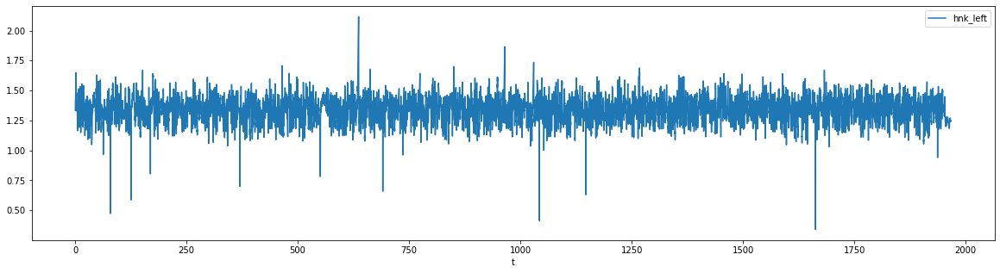

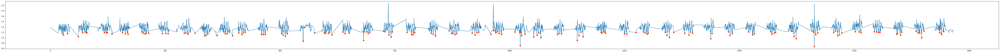

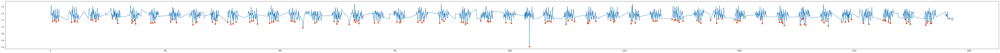

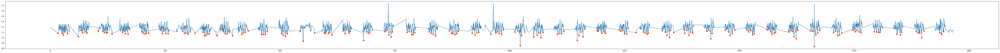

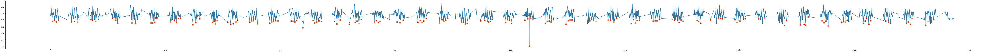

[[1.1671670856778749, 1.0986565479618227, 1.2158555323496971, 1.1509344848553436], [1.039714365917084], [1.2734867699486403, 1.1831464834553618, 1.2152408695974737, 1.1786069217378201], [1.2404649790017674], [1.239156570456272, 1.1918098937691386, 1.1795198670340534, 1.1878193367421999], [1.1359631711245788], [1.192141253303824, 1.2525879990492705, 1.143009670221811, 1.1307391910668707, 1.3141532812485093], [], [1.2176513072356858, 1.1676372959262822, 1.140426578560895, 1.1701593085822022, 1.1661593178694487], [], [1.2811222700474303, 1.1516309921753622, 1.2419975152839808, 1.1577549988330151, 1.1418223250928041], [], [1.241173036939097, 1.1713724467064317, 1.1736101119611422, 1.1308060011221526], [1.162454109421621], [1.203622620933093, 1.073471786215942, 1.087117024372332, 1.1371893710448948, 1.137560031647182], [1.0821382838833868], [1.281198723655374, 1.2167394840374146, 1.145770644413809, 1.146504832510256], [1.0719157058208013], [1.1164078338044627, 1.1753083278785124, 1.19653766

In [40]:
df_hank.plot(x ='t', y='hnk_left', kind = 'line',figsize=(20,5))
plt.show()

peaks_plus=get_valleys(df_plus,df_plus.hip_ankle_plus,0.3)
peaks_minus=get_valleys(df_minus,df_minus.hnk_left,0.3)
Time_to_index_ratio=(peaks_plus[1]-peaks_plus[0])/(df.t[peaks_plus[1]]-df.t[peaks_plus[0]])
df_plus_left=time_diff(peaks_plus,df_plus)
df_minus_left=time_diff(peaks_minus,df_minus)
plus_peaks_L=remove_distinct_valleys(df_plus_left,df_plus,Time_to_index_ratio,df_plus.hip_ankle_plus,0.2,0.2)
minus_peaks_L=remove_distinct_valleys(df_minus_left,df_minus,Time_to_index_ratio,df_minus.hnk_left,0.2,0.2)

plus_peaks_sets=sample(df_plus,df_plus.hip_ankle_plus,plus_peaks_L,time_return_points)
minus_peaks_sets=sample(df_minus,df_minus.hnk_left,minus_peaks_L,time_return_points)
print(plus_peaks_sets)
print(minus_peaks_sets)

hnk_plus_L=list((map(lambda a : np.mean(a), plus_peaks_sets[plus::2])))
hnk_minus_L=list((map(lambda a : np.mean(a), minus_peaks_sets[minus::2])))
print(hnk_plus_L)
print('\n')
print(hnk_minus_L)

D13=comb_dir_arrays(hnk_plus_L,hnk_minus_L,plus,minus)
print (D13)
print (len(D13))
D_s[6][1]=D13



In [ ]:
output = open('para_values/{}.pkl'.format(name), 'wb')
pickle.dump(T_s, output)
output.close()